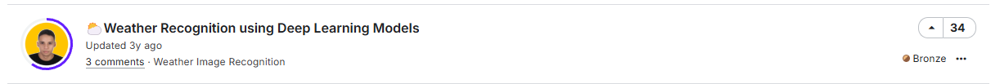

In [1]:
import os
import glob
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import Callback, EarlyStopping
from sklearn.metrics import confusion_matrix, classification_report

In [2]:
path = 'D:\code_study\ML_CODE\dataSets\Weather_Image_Recognition\dataset'
path_imgs = list(glob.glob(path+'/**/*.jpg'))

In [4]:
labels = list(map(lambda x:os.path.split(os.path.split(x)[0])[1], path_imgs))
file_path = pd.Series(path_imgs, name='File_Path').astype(str)
labels = pd.Series(labels, name='Labels')
data = pd.concat([file_path, labels], axis=1)
data = data.sample(frac=1).reset_index(drop=True)
data.head()

,File_Path,Labels
0,D:\code_study\ML_CODE\dataSets\Weather_Image_R...,frost
1,D:\code_study\ML_CODE\dataSets\Weather_Image_R...,snow
2,D:\code_study\ML_CODE\dataSets\Weather_Image_R...,sandstorm
3,D:\code_study\ML_CODE\dataSets\Weather_Image_R...,glaze
4,D:\code_study\ML_CODE\dataSets\Weather_Image_R...,dew


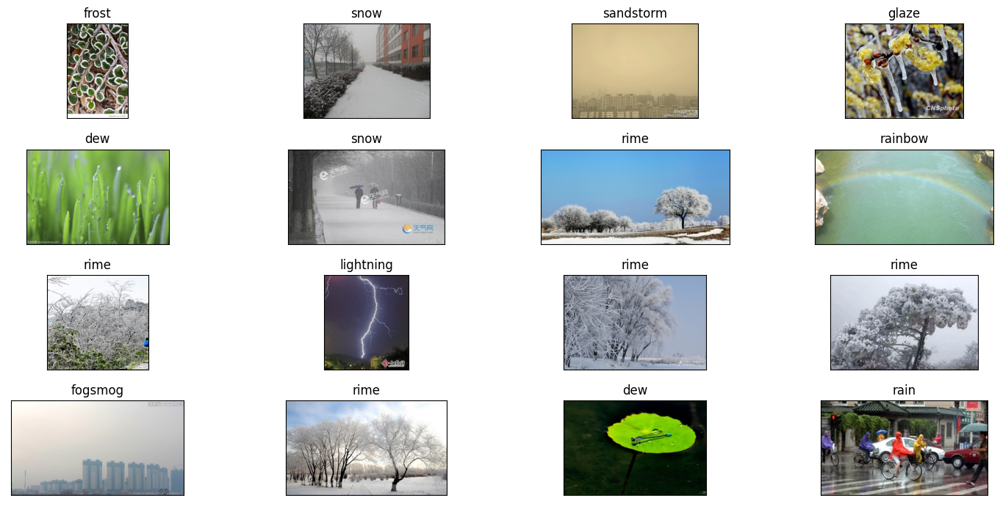

In [5]:
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(15, 7),
                        subplot_kw={'xticks': [], 'yticks': []})
for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(data.File_Path[i]))
    ax.set_title(data.Labels[i])
plt.tight_layout()
plt.show()

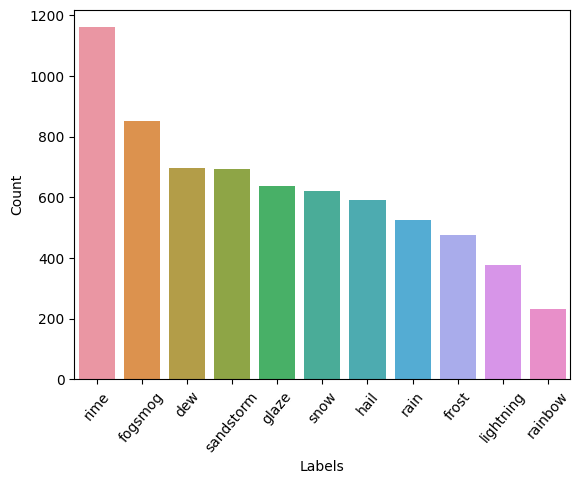

In [6]:
counts = data.Labels.value_counts()
sns.barplot(x=counts.index, y=counts)
plt.xlabel('Labels')
plt.ylabel('Count')
plt.xticks(rotation=50);

In [7]:
train_df, test_df = train_test_split(data, test_size=0.2, random_state=2)

In [23]:
def gen(pre,train,test):
    train_datagen = ImageDataGenerator(preprocessing_function=pre, validation_split=0.2)
    test_datagen = ImageDataGenerator(preprocessing_function=pre)
    
    train_gen = train_datagen.flow_from_dataframe(
        dataframe=train,
        x_col='File_Path',
        y_col='Labels',
        target_size=(100,100),
        class_mode='categorical',
        batch_size=32,
        shuffle=True,
        seed=0,
        subset='training',
        rotation_range=30,
        zoom_range=0.15,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.15,
        horizontal_flip=True,
        fill_mode="nearest")
    valid_gen = train_datagen.flow_from_dataframe(
        dataframe=train,
        x_col='File_Path',
        y_col='Labels',
        target_size=(100,100),
        class_mode='categorical',
        batch_size=32,
        shuffle=False,
        seed=0,
        subset='validation',
        rotation_range=30,
        zoom_range=0.15,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.15,
        horizontal_flip=True,
        fill_mode="nearest")
    test_gen = test_datagen.flow_from_dataframe(
        dataframe=test,
        x_col='File_Path',
        y_col='Labels',
        target_size=(100,100),
        color_mode='rgb',
        class_mode='categorical',
        batch_size=32,
        verbose=0,
        shuffle=False)
    return train_gen, valid_gen, test_gen

In [24]:
def func(name_model):
    pre_model = name_model(input_shape=(100,100, 3),
                   include_top=False,
                   weights='imagenet',
                   pooling='avg')
    pre_model.trainable = False
    inputs = pre_model.input
    x = Dense(100, activation='relu')(pre_model.output)
    x = Dense(100, activation='relu')(x)
    outputs = Dense(11, activation='softmax')(x)
    model = Model(inputs=inputs, outputs=outputs)
    model.compile(loss = 'categorical_crossentropy',optimizer='Adam',metrics=['accuracy'])
    my_callbacks  = [EarlyStopping(monitor='val_loss',
                              min_delta=0,
                              patience=10,
                              mode='auto')]
    return model, my_callbacks

In [25]:
def plot(history,test_gen,train_gen,model):
    # Plotting Accuracy, val_accuracy, loss, val_loss
    fig, ax = plt.subplots(1, 2, figsize=(10, 3))
    ax = ax.ravel()

    for i, met in enumerate(['accuracy', 'loss']):
        ax[i].plot(history.history[met])
        ax[i].plot(history.history['val_' + met])
        ax[i].set_title('Model {}'.format(met))
        ax[i].set_xlabel('epochs')
        ax[i].set_ylabel(met)
        ax[i].legend(['Train', 'Validation'])
        
    # Predict Data Test
    pred = model.predict(test_gen )
    pred = np.argmax(pred,axis=1)
    labels = (train_gen.class_indices)
    labels = dict((v,k) for k,v in labels.items())
    pred = [labels[k] for k in pred]
    
    # Classification report
    cm=confusion_matrix(test_df.Labels,pred)
    clr = classification_report(test_df.Labels, pred)
    print(clr)
    # Display 6 picture of the dataset with their labels
    fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(12, 8),
                        subplot_kw={'xticks': [], 'yticks': []})

    for i, ax in enumerate(axes.flat):
        ax.imshow(plt.imread(test_df.File_Path.iloc[i+1]))
        ax.set_title(f"True: {test_df.Labels.iloc[i+1]}\nPredicted: {pred[i+1]}")
    plt.tight_layout()
    plt.show()
        
    return history

In [26]:
def result_test(test,model_use):
    results = model_use.evaluate(test, verbose=0)
    
    print("    Test Loss: {:.5f}".format(results[0]))
    print("Test Accuracy: {:.2f}%".format(results[1] * 100))
    
    return results

Found 4392 validated image filenames belonging to 11 classes.
Found 1097 validated image filenames belonging to 11 classes.
Found 1373 validated image filenames belonging to 11 classes.
              precision    recall  f1-score   support

         dew       0.87      0.86      0.86       133
     fogsmog       0.84      0.77      0.80       192
       frost       0.61      0.57      0.59        84
       glaze       0.62      0.74      0.68       124
        hail       0.81      0.91      0.86       134
   lightning       0.87      0.91      0.89        91
        rain       0.86      0.82      0.84       114
     rainbow       0.94      0.96      0.95        47
        rime       0.88      0.70      0.78       229
   sandstorm       0.75      0.82      0.78       131
        snow       0.55      0.66      0.60        94

    accuracy                           0.78      1373
   macro avg       0.78      0.79      0.78      1373
weighted avg       0.79      0.78      0.78      1373



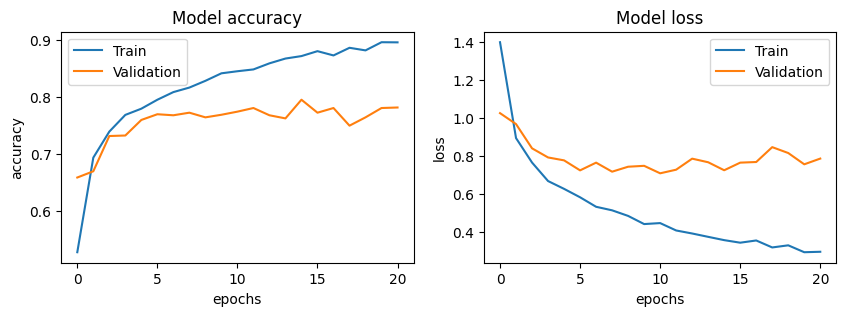

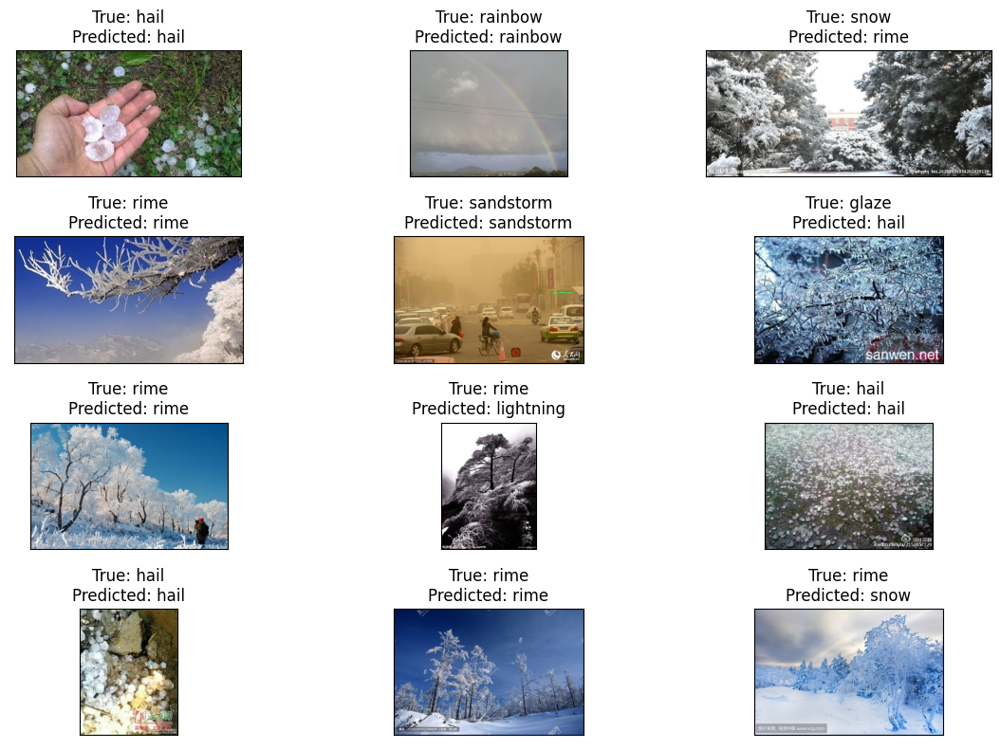

    Test Loss: 0.69259
Test Accuracy: 78.30%


In [27]:
from tensorflow.keras.applications import EfficientNetB7
from tensorflow.keras.applications.efficientnet import preprocess_input
ENet_pre=preprocess_input
train_gen_ENet, valid_gen_ENet, test_gen_ENet = gen(ENet_pre,train_df,test_df)
ENet_model, callback=func(EfficientNetB7)
history = ENet_model.fit(
    train_gen_ENet,
    validation_data=valid_gen_ENet,
    epochs=100,
    callbacks=callback,
    verbose=0
)
history_ENet=plot(history,test_gen_ENet,train_gen_ENet, ENet_model)

result_ENet = result_test(test_gen_ENet,ENet_model)

Found 4392 validated image filenames belonging to 11 classes.
Found 1097 validated image filenames belonging to 11 classes.
Found 1373 validated image filenames belonging to 11 classes.
Epoch 1/100
138/138 [==============================] - 13s 82ms/step - loss: 1.2142 - accuracy: 0.5925 - val_loss: 0.5377 - val_accuracy: 0.8077
Epoch 2/100
138/138 [==============================] - 10s 73ms/step - loss: 0.3784 - accuracy: 0.8644 - val_loss: 0.4997 - val_accuracy: 0.8250
Epoch 3/100
138/138 [==============================] - 9s 68ms/step - loss: 0.2424 - accuracy: 0.9192 - val_loss: 0.5726 - val_accuracy: 0.8122
Epoch 4/100
138/138 [==============================] - 10s 73ms/step - loss: 0.1653 - accuracy: 0.9461 - val_loss: 0.5619 - val_accuracy: 0.8159
Epoch 5/100
138/138 [==============================] - 10s 69ms/step - loss: 0.1159 - accuracy: 0.9609 - val_loss: 0.5179 - val_accuracy: 0.8478
Epoch 6/100
138/138 [==============================] - 9s 68ms/step - loss: 0.0668 - accur

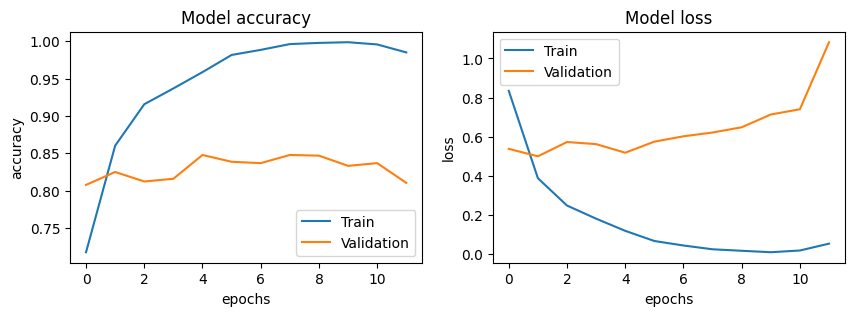

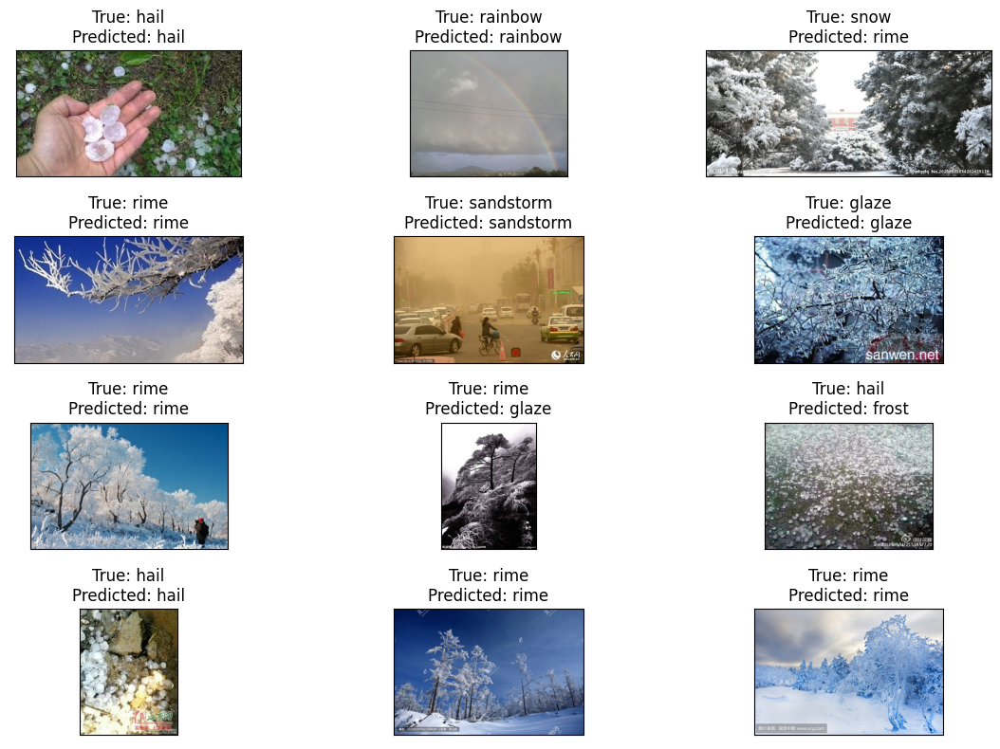

    Test Loss: 0.89646
Test Accuracy: 83.83%


In [28]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
ResNet_pre=preprocess_input
train_gen_ResNet, valid_gen_ResNet, test_gen_ResNet = gen(ResNet_pre,train_df,test_df)
ResNet_model, callback=func(ResNet50)
history = ResNet_model.fit(
    train_gen_ResNet,
    validation_data=valid_gen_ResNet,
    epochs=100,
    callbacks=callback,
    verbose=1
)
history_ResNet= plot(history,test_gen_ResNet,train_gen_ResNet, ResNet_model)

result_ResNet = result_test(test_gen_ResNet,ResNet_model)

Found 4392 validated image filenames belonging to 11 classes.
Found 1097 validated image filenames belonging to 11 classes.
Found 1373 validated image filenames belonging to 11 classes.
Epoch 1/100
138/138 [==============================] - 9s 64ms/step - loss: 1.4044 - accuracy: 0.5368 - val_loss: 0.5948 - val_accuracy: 0.8122
Epoch 2/100
138/138 [==============================] - 9s 62ms/step - loss: 0.4626 - accuracy: 0.8400 - val_loss: 0.5585 - val_accuracy: 0.8077
Epoch 3/100
138/138 [==============================] - 9s 63ms/step - loss: 0.2839 - accuracy: 0.9047 - val_loss: 0.5942 - val_accuracy: 0.8104
Epoch 4/100
138/138 [==============================] - 9s 63ms/step - loss: 0.1905 - accuracy: 0.9409 - val_loss: 0.5661 - val_accuracy: 0.8268
Epoch 5/100
138/138 [==============================] - 9s 65ms/step - loss: 0.1146 - accuracy: 0.9662 - val_loss: 0.6133 - val_accuracy: 0.8113
Epoch 6/100
138/138 [==============================] - 9s 61ms/step - loss: 0.0710 - accuracy:

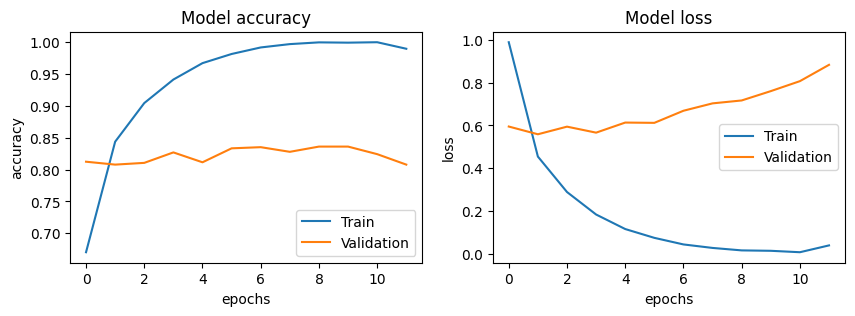

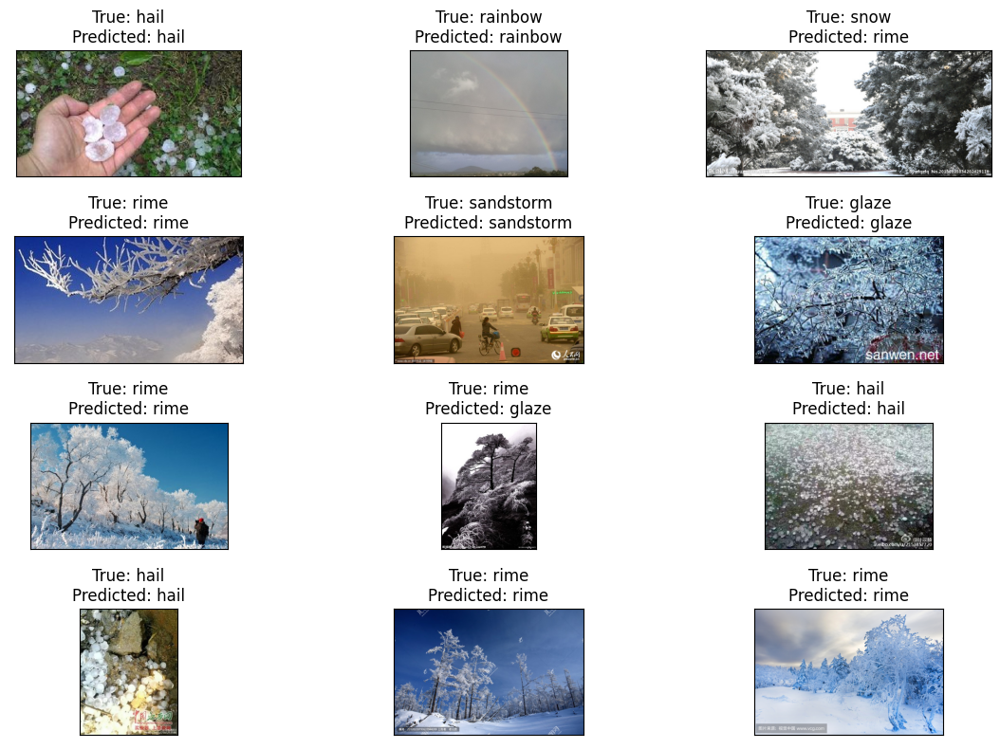

    Test Loss: 0.89979
Test Accuracy: 80.12%


In [29]:
from tensorflow.keras.applications import MobileNet
from tensorflow.keras.applications.mobilenet import preprocess_input
MobileNet_pre=preprocess_input
train_gen_MobileNet, valid_gen_MobileNet, test_gen_MobileNet = gen(MobileNet_pre,train_df,test_df)
MobileNet_model, callback=func(MobileNet)
history = MobileNet_model.fit(
    train_gen_MobileNet,
    validation_data=valid_gen_MobileNet,
    epochs=100,
    callbacks=callback,
    verbose=1
)
history_MobileNet = plot(history,test_gen_MobileNet,train_gen_MobileNet, MobileNet_model)

result_MobileNet = result_test(test_gen_MobileNet,MobileNet_model)

Found 4392 validated image filenames belonging to 11 classes.
Found 1097 validated image filenames belonging to 11 classes.
Found 1373 validated image filenames belonging to 11 classes.
Epoch 1/100
138/138 [==============================] - 29s 209ms/step - loss: 2.4349 - accuracy: 0.4463 - val_loss: 0.8535 - val_accuracy: 0.7375
Epoch 2/100
138/138 [==============================] - 20s 141ms/step - loss: 0.5724 - accuracy: 0.8160 - val_loss: 0.7888 - val_accuracy: 0.7548
Epoch 3/100
138/138 [==============================] - 24s 172ms/step - loss: 0.3887 - accuracy: 0.8758 - val_loss: 0.7599 - val_accuracy: 0.7675
Epoch 4/100
138/138 [==============================] - 15s 107ms/step - loss: 0.2388 - accuracy: 0.9265 - val_loss: 0.7436 - val_accuracy: 0.7776
Epoch 5/100
138/138 [==============================] - 16s 116ms/step - loss: 0.1642 - accuracy: 0.9570 - val_loss: 0.8015 - val_accuracy: 0.7821
Epoch 6/100
138/138 [==============================] - 14s 102ms/step - loss: 0.1125

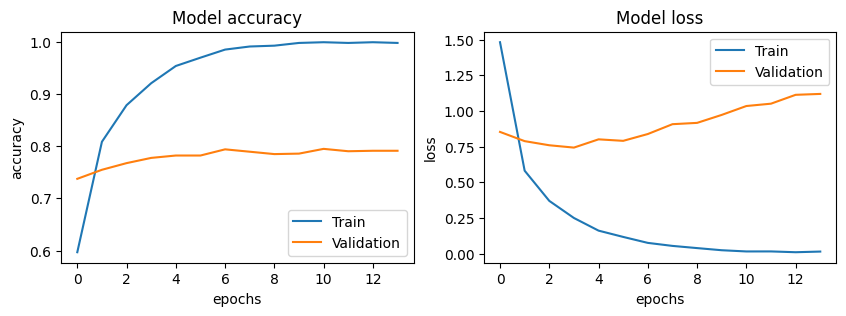

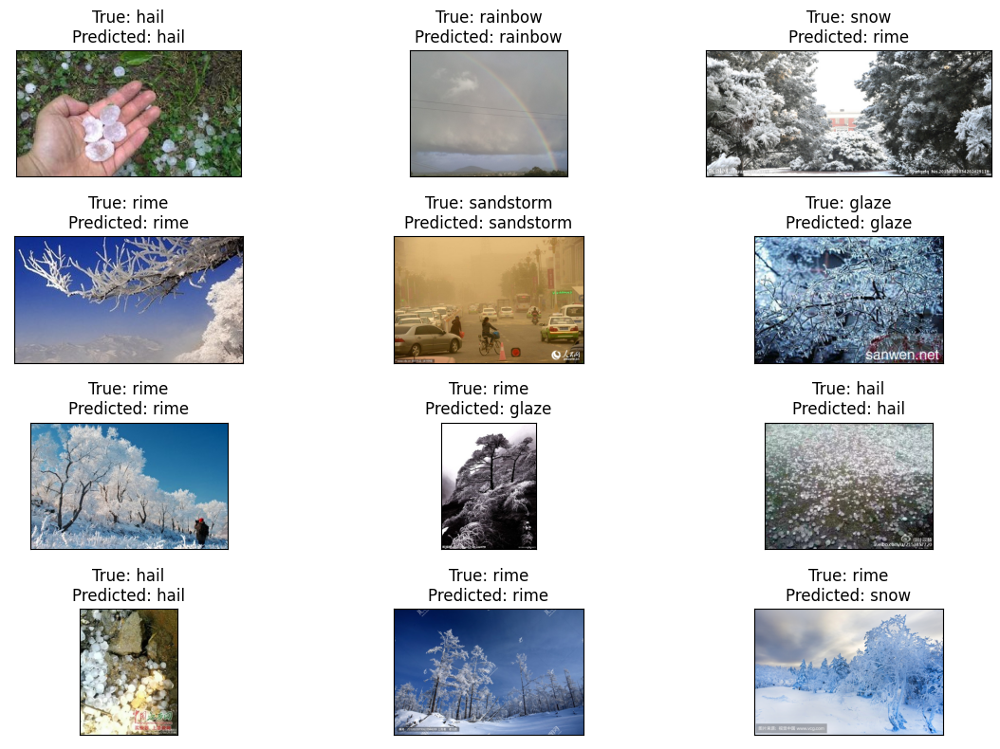

    Test Loss: 0.99978
Test Accuracy: 81.28%


In [30]:
from tensorflow.keras.applications import VGG19
from tensorflow.keras.applications.vgg19 import preprocess_input
VGG19_pre=preprocess_input
train_gen_VGG19, valid_gen_VGG19, test_gen_VGG19 = gen(VGG19_pre,train_df,test_df)
VGG19_model, callback=func(VGG19)
history = VGG19_model.fit(
    train_gen_VGG19,
    validation_data=valid_gen_VGG19,
    epochs=100,
    callbacks=callback,
    verbose=1
)
history_VGG19= plot(history,test_gen_VGG19,train_gen_VGG19, VGG19_model)

result_VGG19 = result_test(test_gen_VGG19,VGG19_model)

Found 4392 validated image filenames belonging to 11 classes.
Found 1097 validated image filenames belonging to 11 classes.
Found 1373 validated image filenames belonging to 11 classes.
Epoch 1/100
138/138 [==============================] - 11s 73ms/step - loss: 1.6206 - accuracy: 0.4985 - val_loss: 0.9231 - val_accuracy: 0.7001
Epoch 2/100
138/138 [==============================] - 9s 64ms/step - loss: 0.7409 - accuracy: 0.7583 - val_loss: 0.8618 - val_accuracy: 0.7110
Epoch 3/100
138/138 [==============================] - 9s 64ms/step - loss: 0.5298 - accuracy: 0.8266 - val_loss: 0.7580 - val_accuracy: 0.7648
Epoch 4/100
138/138 [==============================] - 9s 63ms/step - loss: 0.3919 - accuracy: 0.8716 - val_loss: 0.7606 - val_accuracy: 0.7721
Epoch 5/100
138/138 [==============================] - 10s 69ms/step - loss: 0.3032 - accuracy: 0.9062 - val_loss: 0.8821 - val_accuracy: 0.7621
Epoch 6/100
138/138 [==============================] - 9s 67ms/step - loss: 0.2068 - accurac

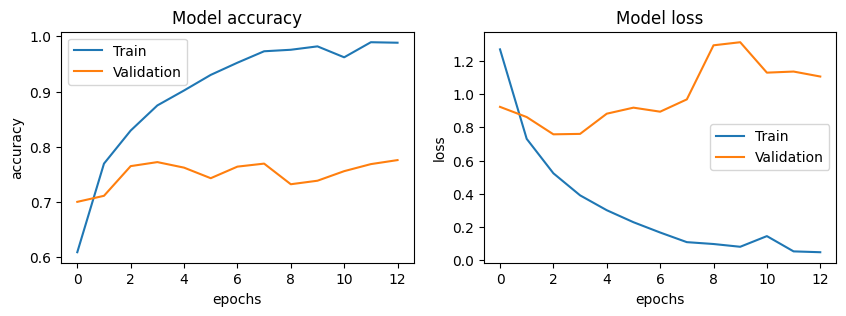

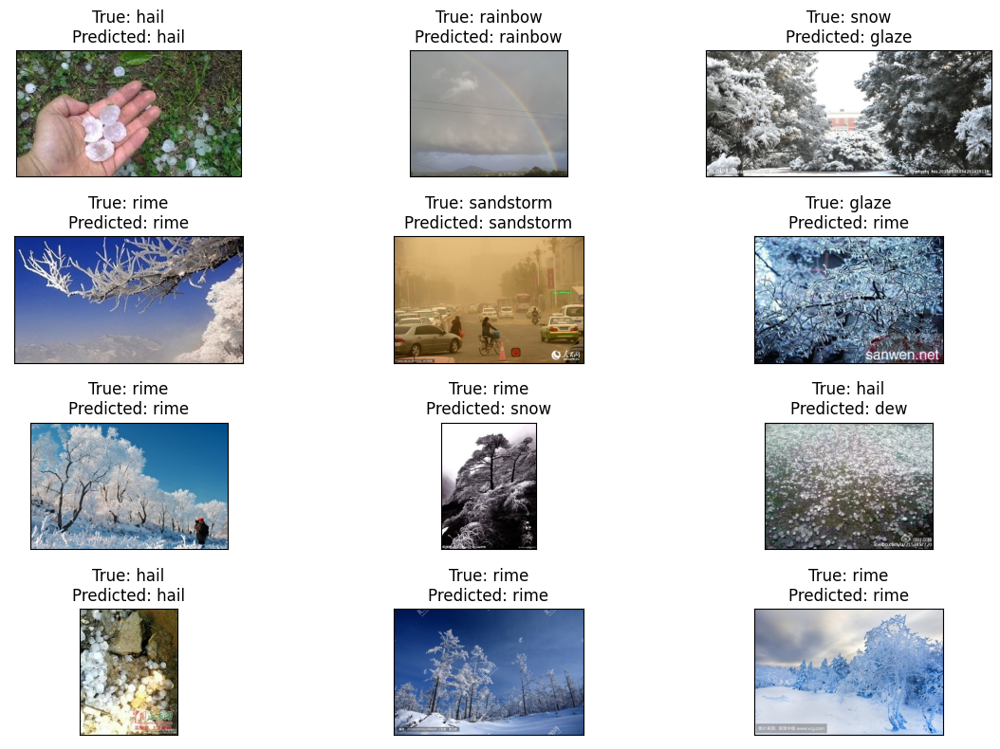

    Test Loss: 1.19531
Test Accuracy: 74.80%


In [31]:
from tensorflow.keras.applications import Xception
from tensorflow.keras.applications.xception import preprocess_input
Xception_pre=preprocess_input
train_gen_Xception, valid_gen_Xception, test_gen_Xception = gen(Xception_pre,train_df,test_df)
Xception_model, callback=func(Xception)
history = Xception_model.fit(
    train_gen_Xception,
    validation_data=valid_gen_Xception,
    epochs=100,
    callbacks=callback,
    verbose=1
)
history_Xception = plot(history,test_gen_Xception,train_gen_Xception, Xception_model)
result_Xception = result_tresult_Xception = result_test(test_gen_Xception,Xception_model)

Found 4392 validated image filenames belonging to 11 classes.
Found 1097 validated image filenames belonging to 11 classes.
Found 1373 validated image filenames belonging to 11 classes.
Epoch 1/100
138/138 [==============================] - 17s 88ms/step - loss: 1.6819 - accuracy: 0.4672 - val_loss: 1.0705 - val_accuracy: 0.6627
Epoch 2/100
138/138 [==============================] - 10s 74ms/step - loss: 0.8118 - accuracy: 0.7377 - val_loss: 1.0216 - val_accuracy: 0.6837
Epoch 3/100
138/138 [==============================] - 10s 74ms/step - loss: 0.6005 - accuracy: 0.8106 - val_loss: 0.9559 - val_accuracy: 0.7147
Epoch 4/100
138/138 [==============================] - 10s 74ms/step - loss: 0.4595 - accuracy: 0.8504 - val_loss: 1.0310 - val_accuracy: 0.7129
Epoch 5/100
138/138 [==============================] - 10s 74ms/step - loss: 0.3588 - accuracy: 0.8851 - val_loss: 1.0442 - val_accuracy: 0.7110
Epoch 6/100
138/138 [==============================] - 11s 79ms/step - loss: 0.2866 - acc

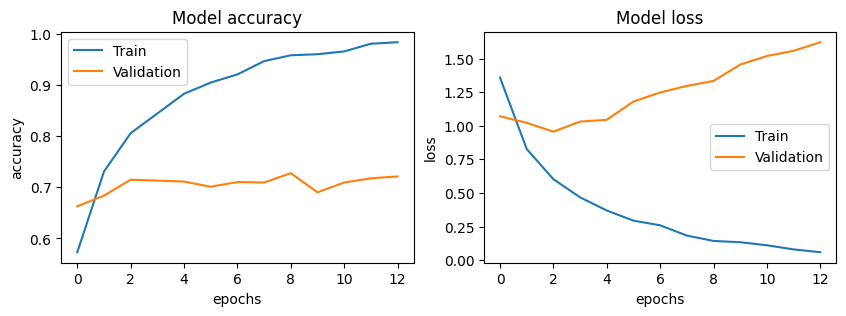

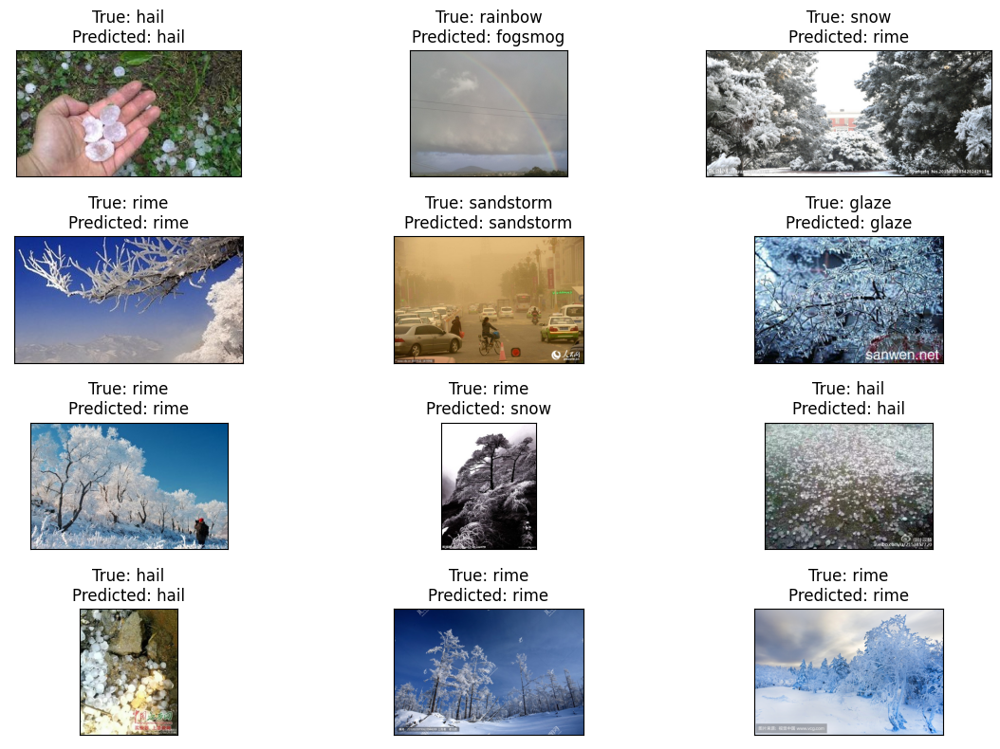

    Test Loss: 1.47493
Test Accuracy: 74.14%


In [32]:
from tensorflow.keras.applications import InceptionResNetV2
from tensorflow.keras.applications.inception_resnet_v2 import preprocess_input
IRNV2_pre=preprocess_input
train_gen_IRNV2, valid_gen_IRNV2, test_gen_IRNV2 = gen(IRNV2_pre,train_df,test_df)
IRNV2_model, callback=func(InceptionResNetV2)
history = IRNV2_model.fit(
    train_gen_IRNV2,
    validation_data=valid_gen_IRNV2,
    epochs=100,
    callbacks=callback,
    verbose=1
)
history_IRNV2 =plot(history,test_gen_IRNV2,train_gen_IRNV2, IRNV2_model)
result_IRNV2 = result_tresult_IRNV2 = result_test(test_gen_IRNV2,IRNV2_model)

Found 4392 validated image filenames belonging to 11 classes.
Found 1097 validated image filenames belonging to 11 classes.
Found 1373 validated image filenames belonging to 11 classes.
Epoch 1/100
138/138 [==============================] - 16s 114ms/step - loss: 2.7046 - accuracy: 0.4368 - val_loss: 0.9267 - val_accuracy: 0.7201
Epoch 2/100
138/138 [==============================] - 12s 88ms/step - loss: 0.5921 - accuracy: 0.8012 - val_loss: 0.8198 - val_accuracy: 0.7539
Epoch 3/100
138/138 [==============================] - 13s 93ms/step - loss: 0.3754 - accuracy: 0.8721 - val_loss: 0.7267 - val_accuracy: 0.7858
Epoch 4/100
138/138 [==============================] - 12s 90ms/step - loss: 0.2537 - accuracy: 0.9179 - val_loss: 0.7503 - val_accuracy: 0.7803
Epoch 5/100
138/138 [==============================] - 12s 88ms/step - loss: 0.1751 - accuracy: 0.9474 - val_loss: 0.7828 - val_accuracy: 0.7876
Epoch 6/100
138/138 [==============================] - 12s 88ms/step - loss: 0.1228 - ac

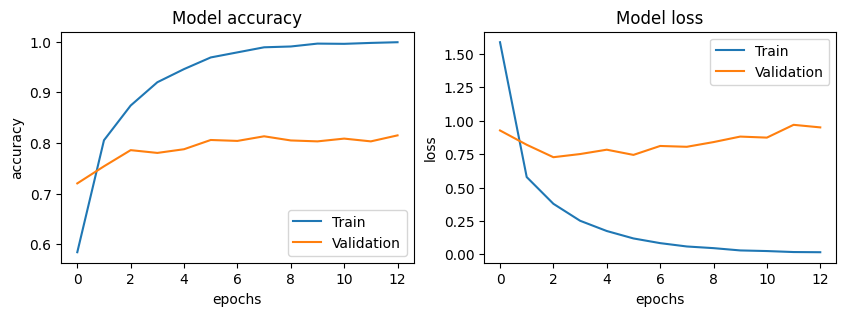

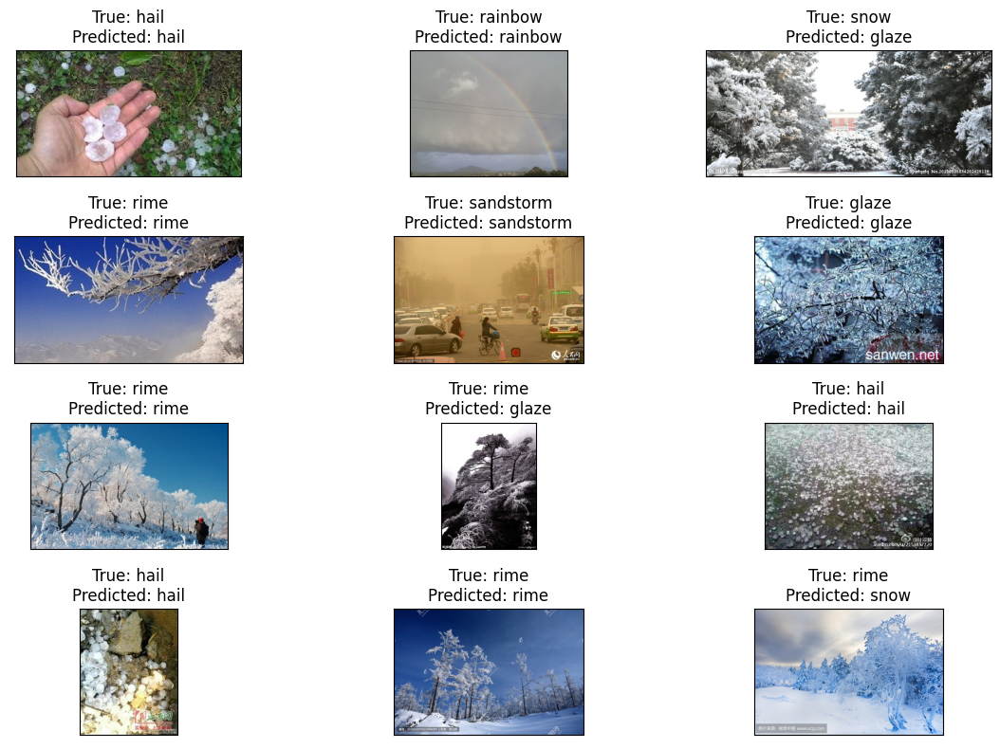

    Test Loss: 0.96016
Test Accuracy: 81.65%


In [33]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input

vgg_pre=preprocess_input
train_gen_VGG, valid_gen_VGG, test_gen_VGG = gen(vgg_pre,train_df,test_df)
model_VGG16, callback=func(VGG16)
history = model_VGG16.fit(
    train_gen_VGG,
    validation_data=valid_gen_VGG,
    epochs=100,
    callbacks=callback,
    verbose=1
)
history=plot(history,test_gen_VGG,train_gen_VGG, model_VGG16)
result_VGG16 = result_test(test_gen_VGG,model_VGG16)

Found 4392 validated image filenames belonging to 11 classes.
Found 1097 validated image filenames belonging to 11 classes.
Found 1373 validated image filenames belonging to 11 classes.
Epoch 1/100
138/138 [==============================] - 17s 109ms/step - loss: 1.2408 - accuracy: 0.6107 - val_loss: 0.5173 - val_accuracy: 0.8186
Epoch 2/100
138/138 [==============================] - 14s 98ms/step - loss: 0.3909 - accuracy: 0.8639 - val_loss: 0.4801 - val_accuracy: 0.8286
Epoch 3/100
138/138 [==============================] - 14s 100ms/step - loss: 0.2395 - accuracy: 0.9191 - val_loss: 0.5896 - val_accuracy: 0.8086
Epoch 4/100
138/138 [==============================] - 14s 99ms/step - loss: 0.1977 - accuracy: 0.9340 - val_loss: 0.5109 - val_accuracy: 0.8514
Epoch 5/100
138/138 [==============================] - 14s 99ms/step - loss: 0.1025 - accuracy: 0.9744 - val_loss: 0.5031 - val_accuracy: 0.8560
Epoch 6/100
138/138 [==============================] - 14s 100ms/step - loss: 0.0685 - 

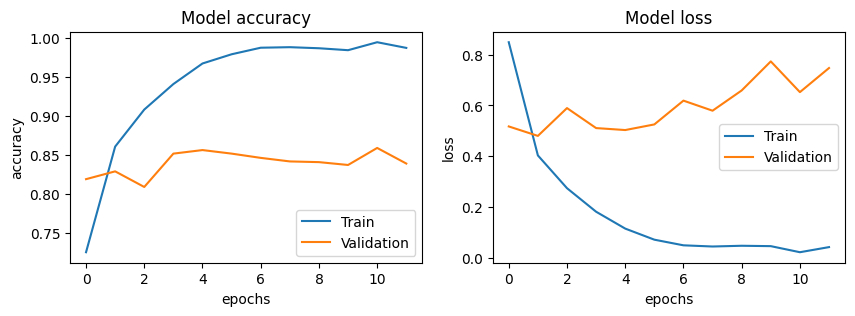

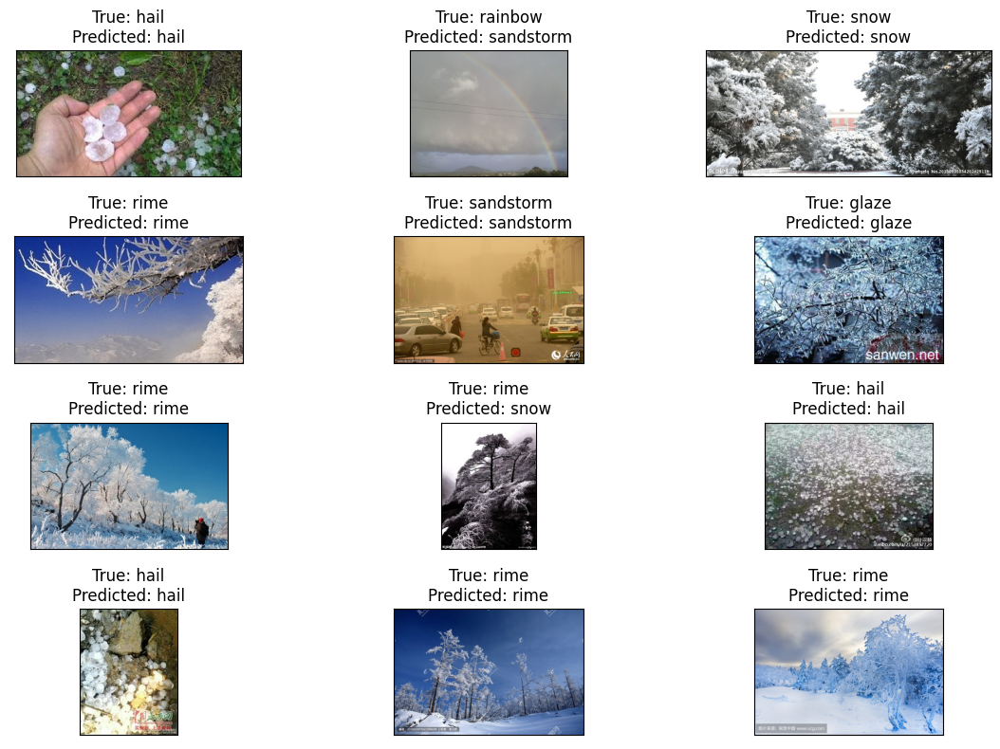

    Test Loss: 0.78072
Test Accuracy: 84.92%


In [34]:
from tensorflow.keras.applications import ResNet101
from tensorflow.keras.applications.resnet import preprocess_input

ResNet101_pre=preprocess_input
train_gen_ResNet101, valid_gen_ResNet101, test_gen_ResNet101 = gen(ResNet101_pre,train_df,test_df)
model_ResNet101, callback=func(ResNet101)
history = model_ResNet101.fit(
    train_gen_ResNet101,
    validation_data=valid_gen_ResNet101,
    epochs=100,
    callbacks=callback,
    verbose=1
)
history=plot(history,test_gen_ResNet101,train_gen_ResNet101, model_ResNet101)
result_ResNet101 = result_test(test_gen_ResNet101,model_ResNet101)

Found 4392 validated image filenames belonging to 11 classes.
Found 1097 validated image filenames belonging to 11 classes.
Found 1373 validated image filenames belonging to 11 classes.
Epoch 1/100
138/138 [==============================] - 17s 88ms/step - loss: 1.4719 - accuracy: 0.5207 - val_loss: 0.6242 - val_accuracy: 0.8113
Epoch 2/100
138/138 [==============================] - 11s 77ms/step - loss: 0.4515 - accuracy: 0.8523 - val_loss: 0.5432 - val_accuracy: 0.8268
Epoch 3/100
138/138 [==============================] - 11s 77ms/step - loss: 0.3109 - accuracy: 0.8921 - val_loss: 0.5166 - val_accuracy: 0.8350
Epoch 4/100
138/138 [==============================] - 11s 78ms/step - loss: 0.2193 - accuracy: 0.9201 - val_loss: 0.6122 - val_accuracy: 0.8286
Epoch 5/100
138/138 [==============================] - 11s 77ms/step - loss: 0.1374 - accuracy: 0.9585 - val_loss: 0.5851 - val_accuracy: 0.8359
Epoch 6/100
138/138 [==============================] - 11s 77ms/step - loss: 0.1242 - acc

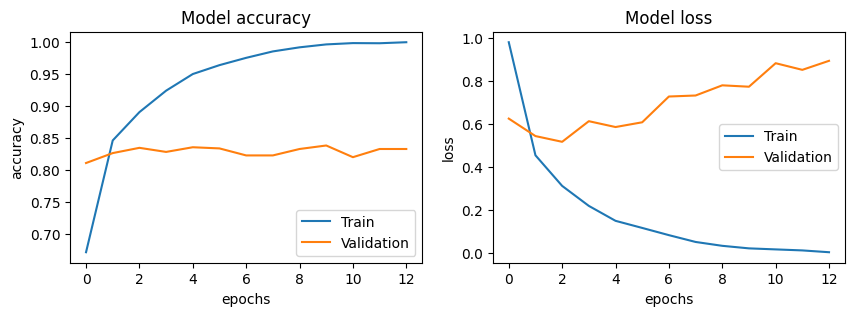

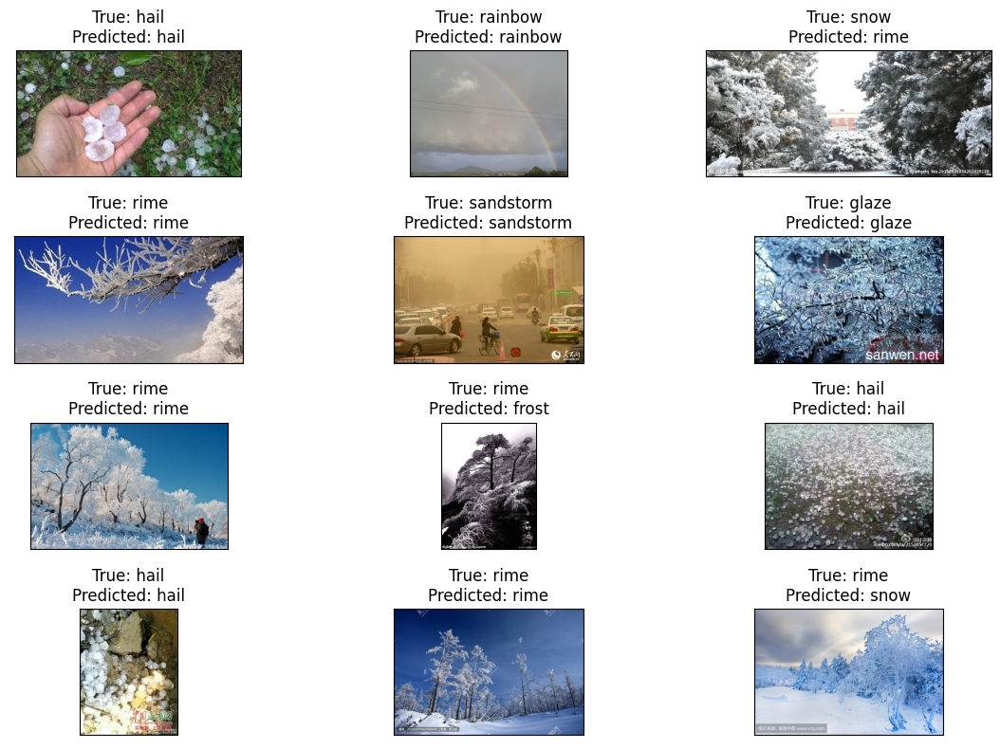

    Test Loss: 0.82038
Test Accuracy: 85.36%


In [35]:
from tensorflow.keras.applications import DenseNet201
from tensorflow.keras.applications.densenet import preprocess_input

DenseNet201_pre=preprocess_input
train_gen_DenseNet201, valid_gen_DenseNet201, test_gen_DenseNet201 = gen(DenseNet201_pre,train_df,test_df)
model_DenseNet201, callback=func(DenseNet201)
history = model_DenseNet201.fit(
    train_gen_DenseNet201,
    validation_data=valid_gen_DenseNet201,
    epochs=100,
    callbacks=callback,
    verbose=1
)
history=plot(history,test_gen_DenseNet201,train_gen_DenseNet201, model_DenseNet201)
result_DenseNet201 = result_test(test_gen_DenseNet201,model_DenseNet201)

In [36]:
output = pd.DataFrame({'Model':['EfficientNetB7','ResNet50','MobileNet','VGG19','Xception','InceptionResNetV2',
                               'VGG16','ResNet101','DenseNet201'],
                      'Accuracy':[result_ENet[1], result_ResNet[1], result_MobileNet[1], result_VGG19[1],
                                  result_Xception[1],result_IRNV2[1],result_VGG16[1],result_ResNet101[1],
                                 result_DenseNet201[1]]})

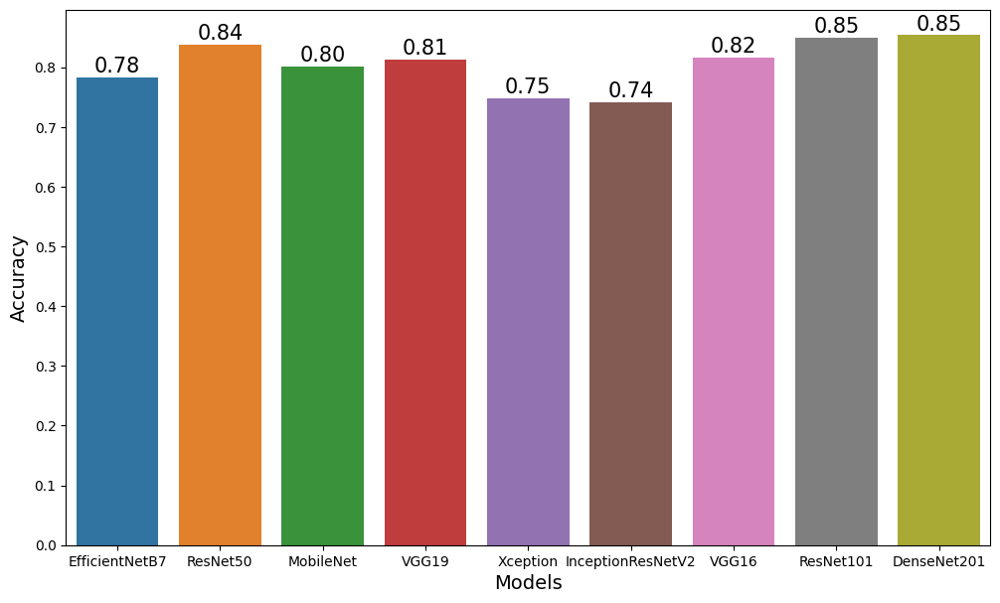

In [37]:
plt.figure(figsize=(12, 7))
plots = sns.barplot(x='Model', y='Accuracy', data=output)
for bar in plots.patches:
    plots.annotate(format(bar.get_height(), '.2f'),
                   (bar.get_x() + bar.get_width() / 2,
                    bar.get_height()), ha='center', va='center',
                   size=15, xytext=(0, 8),
                   textcoords='offset points')

plt.xlabel("Models", size=14)
plt.ylabel("Accuracy", size=14)
plt.show()